### import packages and data

In [1]:
import umap
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn import metrics

### Load Data info

In [2]:
df=pd.read_csv('call_data.csv')
df_msg=pd.read_csv('message_data.csv')
df_search=pd.read_csv('search_data.csv')
df_signup=pd.read_csv('signup_data.csv')

In [3]:
print(df.shape)
print(df_msg.shape)
print(df_search.shape)
df_search.head()


(1223795, 1)
(105785, 1)
(867131, 1)


,user_id\tsearch_ts
0,10001110\t1554188089059
1,10001010\t1553159392120
2,10018492\t1554296508598
3,10008817\t1553186210012
4,10015005\t1554189287541


#### Data Preprocessing


In [4]:
'user_id\tcall_ts'.split('\t')

['user_id', 'call_ts']

In [5]:
def transform_data(df,col1):
    temp_list=[]
    for val in df[col1]:
        val=val.split('\t')
        temp_list.append(val)

    cols=col1.split('\t')
    df_new=pd.DataFrame(temp_list,columns=cols)
    import datetime
    time_list=[]
    for val in df_new[cols[1]]:
        time_list.append(datetime.datetime.fromtimestamp(float(val) / 1000.0, tz=datetime.timezone.utc).strftime('%Y-%m-%dT%H:%M:%SZ'))
    df_new['time']=time_list
    adress=pd.to_datetime(df_new['time']).apply(lambda x: x.date())
    df_new[cols[1]+'_date']=adress
    return df_new
    #df_new.head()

In [6]:
df_call=transform_data(df,'user_id\tcall_ts')
df_call.head()

,user_id,call_ts,time,call_ts_date
0,10016547,1554294993128,2019-04-03T12:36:33Z,2019-04-03
1,10022130,1553790875089,2019-03-28T16:34:35Z,2019-03-28
2,10020436,1553083077679,2019-03-20T11:57:57Z,2019-03-20
3,10004031,1553984897628,2019-03-30T22:28:17Z,2019-03-30
4,10001845,1553445030753,2019-03-24T16:30:30Z,2019-03-24


### Users Activity Visualization - most to least active(Call)-Overall Behavior

In [7]:
def monitor_active_users(df_call):
    df_most_active_callers=df_call['user_id'].value_counts().nlargest(50).reset_index()

    df_most_active_callers['index']=df_most_active_callers['index'].astype('string')

    df_most_active_callers=df_most_active_callers.rename(columns={"index": "id"})
    #df_user_top_callers.head()
    df_least_active_callers=df_call['user_id'].value_counts().nsmallest(50).reset_index()
    #df_user.index=df_user.index.astype('str')
    df_least_active_callers['index']=df_least_active_callers['index'].astype('string')

    df_least_active_callers=df_least_active_callers.rename(columns={"index": "id"})
    #df_user_bottom_callers.head()
    return df_most_active_callers,df_least_active_callers

In [8]:
df_most_active_callers,df_least_active_callers=monitor_active_users(df_call)

In [9]:
def plot_active_user(df_most_active_callers,df_least_active_callers):
    fig = px.bar(df_most_active_callers, x='id', y='user_id',width=2000,text='user_id')
    fig.update_xaxes(type='category')
    fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
    fig.update_traces( textfont_size=8)
    fig.show()
    fig = px.bar(df_least_active_callers, x='id', y='user_id',width=2000,text='user_id')
    fig.update_xaxes(type='category')
    fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
    fig.update_traces( textfont_size=8)
    fig.show()

In [10]:
plot_active_user(df_most_active_callers,df_least_active_callers)

### Message: Data Preprocessing and Visualization


In [11]:
df_msg=transform_data(df_msg,'user_id\tmessage_ts')
df_msg.head()

,user_id,message_ts,time,message_ts_date
0,10024239,1553986083696,2019-03-30T22:48:03Z,2019-03-30
1,10021388,1553197787973,2019-03-21T19:49:47Z,2019-03-21
2,10022286,1552931128388,2019-03-18T17:45:28Z,2019-03-18
3,10023459,1553519190682,2019-03-25T13:06:30Z,2019-03-25
4,10023112,1553967251566,2019-03-30T17:34:11Z,2019-03-30


In [12]:
df_most_active_message_userids,df_least_active_message_userids=monitor_active_users(df_msg)

In [13]:
plot_active_user(df_most_active_message_userids,df_least_active_message_userids)


### Search Data Preprocessing and Visualization

In [14]:
df_search=transform_data(df_search,'user_id\tsearch_ts')



In [15]:
df_most_active_searchers,df_least_active_searchers=monitor_active_users(df_search)
plot_active_user(df_most_active_searchers,df_least_active_searchers)


## Pivot data

In [16]:
df_search_pivot=pd.crosstab(df_search.user_id,df_search.search_ts_date).T
df_msg_pivot=pd.crosstab(df_msg.user_id, df_msg.message_ts_date).T

df_pivot=pd.crosstab(df_call.user_id, df_call.call_ts_date).T

## Day-wise Behavior -Call, Search and Message

In [17]:
def plot_top_active(data,user_list,plot_title):
      fig=go.Figure()
      for i in user_list:
        fig.add_trace(go.Scatter(x=data.index.values,
                                 y=data[i],mode='lines',
                                 name=i))
      fig.update_layout(title=plot_title)
      fig.show()

In [18]:
top_active_search_userlist=df_most_active_searchers['id'][:50].to_list()
top_active_call_userlist=df_most_active_callers['id'][:50].to_list()
top_active_message_userlist=df_most_active_message_userids['id'][:50].to_list()
plot_top_active(df_pivot,top_active_call_userlist,'Call: Top Active Users')
plot_top_active(df_search_pivot,top_active_search_userlist,'Search:Top Active Users')
plot_top_active(df_msg_pivot,top_active_message_userlist,'Message:Top Active Users')

In [19]:
least_active_search_userlist=df_least_active_searchers['id'][:50].to_list()
least_active_call_userlist=df_least_active_callers['id'][:50].to_list()
least_active_message_userlist=df_least_active_message_userids['id'][:50].to_list()
plot_top_active(df_pivot,least_active_call_userlist,'Call: Least Active Users')
plot_top_active(df_search_pivot,least_active_search_userlist,'Search:Least Active Users')
plot_top_active(df_msg_pivot,least_active_message_userlist,'Message:Least Active Users')



Insights on above Visualization:
 - Focused on the users which has high count of call activity and it ranged from 1681 calls  to 2 calls per users.
   Kept around 100 userids in our radar with maximum calls.
 - Focused on the users which has high count of Search activity and it ranged from 5632 searches  to 1 searches per users
 - Focused on the users which has high count of message activity and it ranged from 1961 messages  to 1 messages per users

#### Deepdiving further on analysis,  we are merging the dataframes of each call,message and search data sets to spot suspicious behavior activity based on combination of high message,search and call activity.





### Merging individual dataframes

In [20]:
df_final=pd.concat([df_pivot,df_search_pivot,df_msg_pivot]).groupby(level=0).sum()
df_final.head()

user_id,10000000,10000001,10000002,10000003,10000004,10000005,10000006,10000007,10000008,10000009,...,10025803,10025811,10025832,10025879,10025916,10025932,10025941,10025946,10025967,10025981
2019-03-02,0,0.0,0,0.0,0.0,0.0,0.0,0,0.0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0
2019-03-03,0,4.0,0,0.0,0.0,0.0,0.0,0,0.0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2019-03-04,0,32.0,0,0.0,0.0,0.0,0.0,0,0.0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2019-03-05,0,25.0,0,0.0,0.0,0.0,0.0,0,0.0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2019-03-06,0,19.0,0,0.0,0.0,0.0,0.0,17,0.0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [21]:
df_t=df_final.sum(axis=0).sort_values(ascending=False).reset_index()
df_t.rename({'index':'user_id',0:'count'},axis=1,inplace=True)
df_t.head()


,user_id,count
0,10016499,5635.0
1,10019709,2230.0
2,10002424,2039.0
3,10015483,1820.0
4,10003832,1785.0


### Visualization on merged dataframe

In [22]:
fig = px.bar(df_t[:50], x='user_id', y='count',text='count', width=2000)

fig.update_xaxes(type='category')
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'},title='Top Active (Search/Message/Call) Users')
fig.update_traces( textfont_size=8)
fig.show()



In [23]:
df_t['user_id']=df_t['user_id'].astype('string')

In [24]:
top_active_userlist=df_t['user_id'][:50].to_list()
plot_top_active(df_final,top_active_userlist,'Top Activity(Call/Search/Message) Users trend')

### Creating Dataframe for proposed features- Day wise user behavior , Activity count

In [25]:
df_feature=df_final.T.reset_index()
df_feature.rename({'index':'user_id'},axis=1,inplace=True)


In [26]:
user_list=df_feature['user_id'].values.tolist()


In [27]:
df_feature.head()

,user_id,2019-03-02,2019-03-03,2019-03-04,2019-03-05,2019-03-06,2019-03-07,2019-03-08,2019-03-09,2019-03-10,...,2019-04-02,2019-04-03,2019-04-04,2019-04-05,2019-04-06,2019-04-07,2019-04-08,2019-04-09,2019-04-10,2019-04-11
0,10000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,10000001,0.0,4.0,32.0,25.0,19.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,10000002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,16.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,10000003,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,10000004,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,17.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [28]:
df_feature=pd.merge(left=df_feature,right=df_t,left_on='user_id',right_on='user_id',how='inner')

In [29]:
df_feature.drop('user_id',axis=1,inplace=True)


In [30]:
df_feature.head()

,2019-03-02,2019-03-03,2019-03-04,2019-03-05,2019-03-06,2019-03-07,2019-03-08,2019-03-09,2019-03-10,2019-03-11,...,2019-04-03,2019-04-04,2019-04-05,2019-04-06,2019-04-07,2019-04-08,2019-04-09,2019-04-10,2019-04-11,count
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,53.0
1,0.0,4.0,32.0,25.0,19.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,84.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,98.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,61.0


In [31]:
scaler=MinMaxScaler(feature_range=(0,1))
scaled_df=pd.DataFrame(scaler.fit_transform(df_feature),columns=df_feature.columns,index=df_feature.index)
scaled_df.head()

,2019-03-02,2019-03-03,2019-03-04,2019-03-05,2019-03-06,2019-03-07,2019-03-08,2019-03-09,2019-03-10,2019-03-11,...,2019-04-03,2019-04-04,2019-04-05,2019-04-06,2019-04-07,2019-04-08,2019-04-09,2019-04-10,2019-04-11,count
0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.006296,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.008878
1,0.0,0.007117,0.072562,0.079114,0.044186,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.014382
2,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.008395,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.003729
3,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.007345,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.016868
4,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.009444,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.010298


### Dimensionality Reduction and labelling

In [32]:
fit=umap.UMAP(n_neighbors=int(df_feature.shape[0]*0.025),min_dist=0.001,n_components=2,spread=1.0,metric='euclidean')

In [33]:
%time umap_df=fit.fit_transform(scaled_df)

Wall time: 5min 28s


In [34]:
umap_df=pd.DataFrame({'x':umap_df[:,0],
                      'y':umap_df[:,1],
                      'source':user_list})
umap_df=umap_df.reset_index(drop=True)

In [35]:
umap_df['count']=df_feature['count']
umap_df

,x,y,source,count
0,1.920560,6.840327,10000000,53.0
1,-2.221663,3.113019,10000001,84.0
2,-1.999702,10.659903,10000002,24.0
3,2.521371,11.319745,10000003,98.0
4,-2.078765,13.103436,10000004,61.0
...,...,...,...,...
25995,27.118212,11.111306,10025932,26.0
25996,0.224117,5.176661,10025941,30.0
25997,-3.098669,2.730677,10025946,15.0
25998,0.171864,5.379070,10025967,30.0


In [36]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=2, random_state=0).fit(umap_df.loc[:,['x','y']])
k_labels=kmeans.labels_
umap_df['label']=pd.Series(k_labels).astype('str')

In [37]:
fig=px.scatter(umap_df,x='x',y='y',hover_data=umap_df,color='label',title='Umap Cluster')
fig.show()

### Observations on above graph
#### -- Noticed that there are 2 clusters formation 
#### --The blue cluster shows the data points of the users with low to moderate activity of call/search/message.
#### --The Red Cluster  depicts a trend of users going from normal  behavior activity to sudden spike in activity  of search/call/message performed  across a period.This shows an irregular and suspicious behavior compared to the rest of the users.



### Cluster Analysis-Continued

In [38]:
rf_data=scaled_df

In [39]:
encoded=LabelEncoder()
labels=encoded.fit_transform(k_labels)
x_train,x_test,y_train,y_test=train_test_split(rf_data,labels,test_size=0.2)


In [40]:
rf_classifier=RandomForestClassifier(n_estimators=100,bootstrap=True,max_features='sqrt')

In [41]:
rf_classifier.fit(x_train,y_train)

RandomForestClassifier(max_features='sqrt')

In [42]:
y_pred=rf_classifier.predict(x_test)
print(metrics.classification_report(y_pred,y_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5081
           1       0.86      0.99      0.92       119

    accuracy                           1.00      5200
   macro avg       0.93      0.99      0.96      5200
weighted avg       1.00      1.00      1.00      5200



In [43]:
import shap
explainer=shap.TreeExplainer(rf_classifier,x_test)
shap_values=explainer.shap_values(x_test,approximate=True,check_additivity=False)

### Checking behavior of  cluster - 0 (Red)

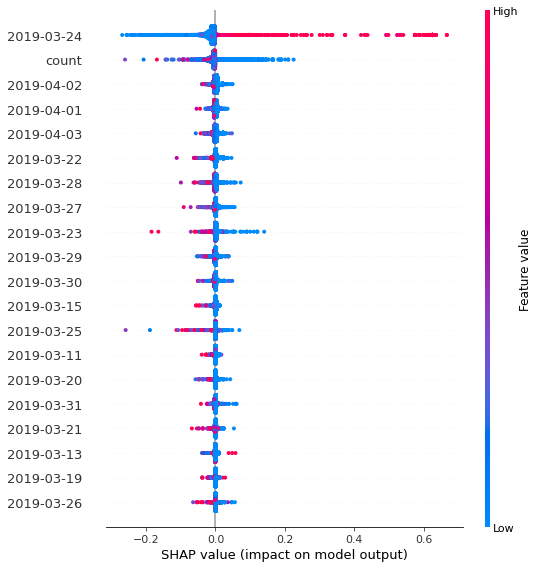

In [44]:
shap.summary_plot(shap_values[1],x_test)

### Feature Importance
Higher user activity on a particular day (24th March 2019) compared to the rest of the days for users falling under red cluster.


### Checking Behavior of  Cluster 1 (Blue)

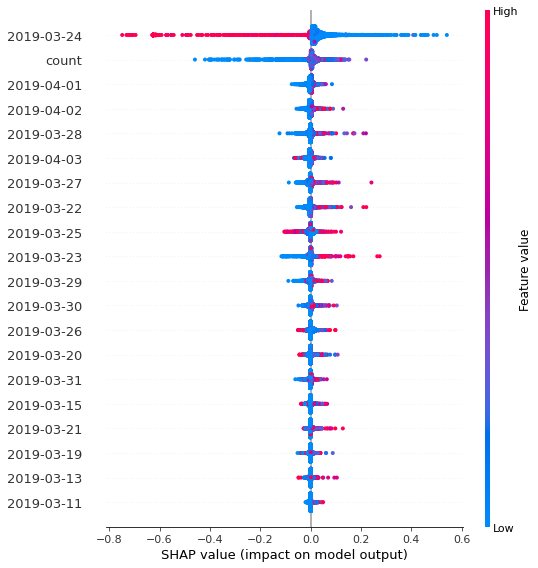

In [45]:
shap.summary_plot(shap_values[0],x_test)

### Feature Importance
Low to Moderate user activity on a particular day (24th March 2019) and rest of the days for users falling under Blue cluster.

### The graph below shows suspected user id’s with their daily activity trend.
#### Sudden spike in the user’s activity on 24th March compared to their normal activity over the rest of the days.
#### There are around 685 such user ids 




In [46]:
suspected_ids=umap_df[umap_df['label']=='1']['source']
suspected_ids.to_csv('suspected_ids.csv',index=False)
plot_top_active(df_final,suspected_ids,'Suspected Ids Trend')

In [47]:
suspected_ids

716      10000758
1077     10001141
1125     10001191
1607     10001699
1664     10001762
           ...   
25982    10025709
25988    10025785
25991    10025811
25995    10025932
25999    10025981
Name: source, Length: 693, dtype: object

# CONCLUSION:
In this case study, i presented the analysis of suspicious or fraudulent looking activity by using data techniques such as preprocessing, analysis, visualization, machine learning algorithm to detect the behavior of suspicious users. I proposed several techniques to achieve the goal. First checked the top and bottom users with high and low call/search/message activity and  then extensively evaluated different state-of-the-art machine learning approaches using the proposed  features : day wise behavior of users and the overall call,message and search volume of them.
The approach helps in answering below questions:
 
### What does average behavior look like?

Based on analysis, we found that the users with low to  moderate activity of calls, messages and searches on most of the days comes under average behavior.
### What might activity from scapers look like?
#### -- Users with high volume of call, message and search activity on particular days.
#### -- Sudden huge spike in the user’s activity from the usual trend. For example- user id ‘10012879’ has  call,search and message activity peaking up to 357 volume only for one particular day while rest other days, there was no activity.

